<a href="https://colab.research.google.com/github/CarlosMendez1997Sei/WETSAT_v2/blob/main/2_Modelling_WETSAT_Google_Colab/Wetsat_Geoprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

	Google Colaboratory
	PostgreSQL
	GitHub	     
	Wetlands flooding extent and trends using SATellite data and Machine Learning WETSAT
	Code Developed by
	Carlos Mendez
	Sebastian Palomino
	Camilo Sanabria                     

# Install packages and libraries used in WETSAT

In [1]:
###################################### Artificial Intelligence Frameworks #####################################################
# scikit-learn Framework
!pip install scikit-learn
###################################### Data, Geoprocessing and Graphics libraries #####################################################
!pip install rasterio
!pip install matplotlib
!pip install numpy
!pip install contextily
!pip install geopandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 60.0 MB/s eta 0:00:00


# Import libraries and packages

In [2]:
## AI packages
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.multioutput import MultiOutputClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.exceptions import UndefinedMetricWarning
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

## Geoprocessing packages
import rasterio
from rasterio.features import rasterize
import numpy as np
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import gc  # Garbage collector to free memory
import os
import contextily as ctx
from shapely.geometry import box
import seaborn as sns
import joblib
import urllib.request
import warnings
from google.colab import files
from google.colab import data_table

# Clone Repository from WETSAT [GitHub](https://github.com/sei-latam/WETSAT_v2)

In [3]:
!git clone https://github.com/sei-latam/WETSAT_v2.git

Cloning into 'WETSAT_v2'...
remote: Enumerating objects: 1191, done.
remote: Counting objects: 100% (157/157), done.
remote: Compressing objects: 100% (81/81), done.
remote: Total 1191 (delta 126), reused 78 (delta 76), pack-reused 1034 (from 1)
Receiving objects: 100% (1191/1191), 5.28 GiB | 35.55 MiB/s, done.
Resolving deltas: 100% (341/341), done.
Updating files: 100% (385/385), done.


# Prepare data and first steps

## Import Sentinel-1 Raster Images (VH-VV) and create Polarization Ratio (PR) index

In [4]:
## Access the VH Path
vh_path = "/content/WETSAT_v2/0_Original_Files/aoi2/sigma_dB/VH"
## Access the VV Path
vv_path = "/content/WETSAT_v2/0_Original_Files/aoi2/sigma_dB/VV"
## Create the PR Index path
pr_path = "/content/WETSAT_v2/0_Original_Files/aoi2/sigma_dB/PR_index"

# Create output directory if it doesn't exist
os.makedirs(pr_path, exist_ok=True)

# List VH and VV files (assuming matching filenames)
vh_files = sorted([f for f in os.listdir(vh_path) if f.endswith(".tif")]) # Search files ending with .tif
vv_files = sorted([f for f in os.listdir(vv_path) if f.endswith(".tif")]) # Search files ending with .tif

# Loop through files and compute PR index scaled between 0 and 1
for vh_file, vv_file in zip(vh_files, vv_files):
    # Read the vh_files and vv_files
    with rasterio.open(os.path.join(vh_path, vh_file)) as vh_src, \
         rasterio.open(os.path.join(vv_path, vv_file)) as vv_src:

        vh = vh_src.read(1).astype("float32") # Converts the data to 32-bit float
        vv = vv_src.read(1).astype("float32") # Converts the data to 32-bit float

        pr_index_diff = vh - vv  # Compute PR index as difference

        # Save PR index difference
        profile = vh_src.profile
        profile.update(dtype="float32", count=1)

        pr_filename = f"PR_diff_{vh_file}"
        with rasterio.open(os.path.join(pr_path, pr_filename), "w", **profile) as dst:
            dst.write(pr_index_diff, 1)

print("PR index (VH - VV) computation complete.")

PR index (VH - VV) computation complete.


## Calculate General Statistics (minimum and maximum values)

In [5]:
def get_min_max_from_folder(folder_path): # Create a function to scan .tif images
    min_val = np.inf # initialize with the min values
    max_val = -np.inf # initialize with the max values

    for filename in sorted(os.listdir(folder_path)): # Begins a loop that iterates through all files in a folder
        if filename.endswith('.tif'):# Search files ending with .tif
            file_path = os.path.join(folder_path, filename) # Read the files using the path and filename
            with rasterio.open(file_path) as src: # Opens a raster file using rasterio
                data = src.read(1) #reads the first band of the raster file
                # Mask out no-data values if needed
                if src.nodata is not None: # Checks if the data include nodata values
                    data = np.ma.masked_equal(data, src.nodata) # Masks out all pixels without nodata
                min_val = min(min_val, data.min()) # Calculate and update the minimum values across all raster files
                max_val = max(max_val, data.max()) # Calculate and update the maximum values across all raster files

    return min_val, max_val #Return the min and max values

# Call the function and calculate min and max values in vh, vv and pr
vh_min, vh_max = get_min_max_from_folder(vh_path)
vv_min, vv_max = get_min_max_from_folder(vv_path)
pr_min, pr_max = get_min_max_from_folder(pr_path)

#Print the results
print(f"VH min: {vh_min}, VH max: {vh_max}")
print(f"VV min: {vv_min}, VV max: {vv_max}")
print(f"PR min: {pr_min}, PR max: {pr_max}")

VH min: -63.30115509033203, VH max: 14.939030647277832
VV min: -47.164337158203125, VV max: 23.44919204711914
PR min: -47.79340744018555, PR max: 21.402484893798828


## Plot and visualize the Polarizaton Ratio (PR)

In [6]:
def visualize_images_grid_percentile(folder_path, title_prefix="PR Index"): # Create a function with (folder_path, title_prefix) as parameters
    tif_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.tif')]) # Search and scan in the path all raster images ending with .tif
    num_files = len(tif_files) # Calculate the number and total of files
    images_per_fig = 6 # Configure the number of images per figure

    for i in range(0, num_files, images_per_fig): # Initialize the looping
        fig, axes = plt.subplots(1, images_per_fig, figsize=(18, 3)) # Configure the subplots and size of images (18x3)
        axes = axes.flatten() # Specify that the axes are a flat 1D array

        for j in range(images_per_fig): #  loop that iterates over the number of images you want to display per figure:
            idx = i + j # Calculates the index of the current image file to be processed:
            if idx < num_files: # Verify the index is lower than number of files
                filename = tif_files[idx] # retrieves the filename at the current index from the sorted list of  files:
                with rasterio.open(os.path.join(folder_path, filename)) as src: # This line opens a raster file using its full path:
                    data = src.read(1) # This line reads the first band of the raster file
                    if src.nodata is not None: # Checks whether the raster file has a defined nodata value
                        data = np.ma.masked_equal(data, src.nodata) # smart way to handle missing or invalid data in raster files:

                    # Compute 2nd and 98th percentiles
                    p2 = np.nanpercentile(data, 2)
                    p98 = np.nanpercentile(data, 98)

                    # Clip data to percentile range
                    stretched = np.clip(data, p2, p98)

                    # Plot the images
                    im = axes[j].imshow(stretched, cmap='viridis', vmin=p2, vmax=p98)
                    axes[j].set_title(f"{filename}", fontsize=8) # Print the name of file
                    axes[j].axis('off')
                    fig.colorbar(im, ax=axes[j], shrink=1.0) # Adds a colorbar to the subplot displaying the raster image:
            else:
                axes[j].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.95]) # adjusts the layout of your figure to prevent overlapping elements:
        plt.show()

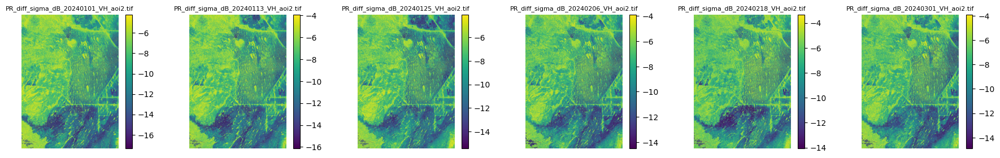

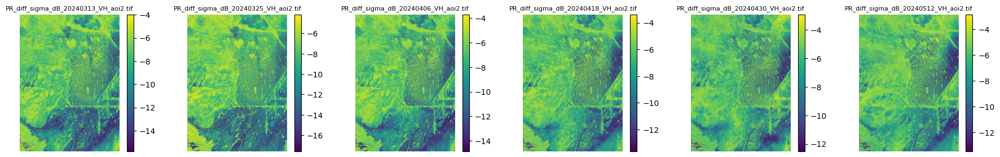

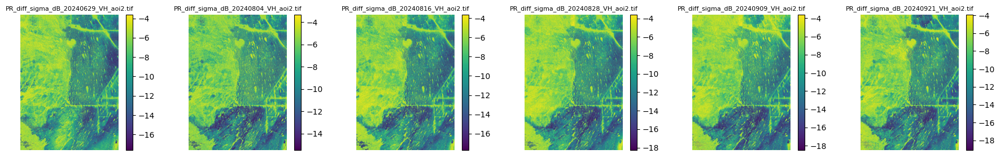

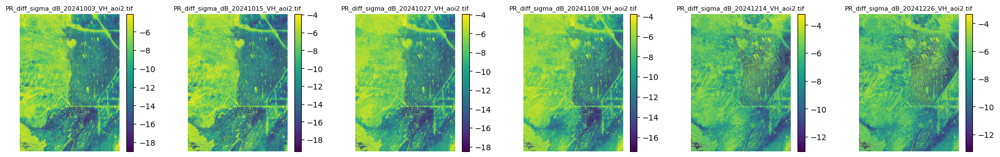

In [ ]:
visualize_images_grid_percentile(pr_path, title_prefix="PR Index")

## Plot and visualize the VH and VV images

In [7]:
def visualize_images_grid(folder_path, vmin, vmax, title_prefix): # Create a function with (folder_path, title_prefix) as parameters
    tif_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.tif')]) # Search and scan in the path all raster images ending with .tif
    num_files = len(tif_files) # Calculate the number and total of files
    images_per_fig = 6 # Configure the number of images per figure

    for i in range(0, num_files, images_per_fig): # Initialize the looping
        fig, axes = plt.subplots(1, 6, figsize=(18, 3)) # Configure the subplots and size of images (18x3)
        axes = axes.flatten() # Specify that the axes are a flat 1D array

        for j in range(images_per_fig): #  loop that iterates over the number of images you want to display per figure:
            idx = i + j # Calculates the index of the current image file to be processed:
            if idx < num_files: # Verify the index is lower than number of files
                filename = tif_files[idx] # retrieves the filename at the current index from the sorted list of  files:
                with rasterio.open(os.path.join(folder_path, filename)) as src: # This line opens a raster file using its full path:
                    data = src.read(1) # This line reads the first band of the raster file
                    if src.nodata is not None: # Checks whether the raster file has a defined nodata value
                        data = np.ma.masked_equal(data, src.nodata) # smart way to handle missing or invalid data in raster files:
                    im = axes[j].imshow(data, cmap='viridis', vmin=vmin, vmax=vmax)
                    axes[j].set_title(filename, fontsize=10)  # Print the name of file
                    axes[j].axis('off')
                    fig.colorbar(im, ax=axes[j], shrink=1.0) # Adds a colorbar to the subplot displaying the raster image:
            else:
                axes[j].axis('off')  # Hide unused subplot

        plt.tight_layout(rect=[0, 0, 1, 0.95]) # adjusts the layout of your figure to prevent overlapping elements:
        plt.show()

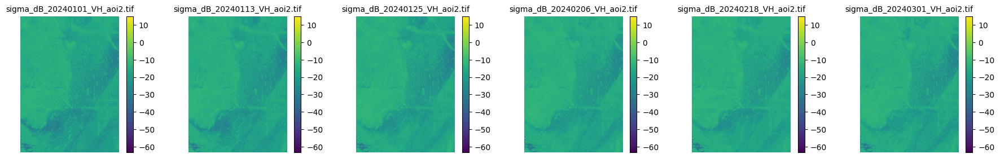

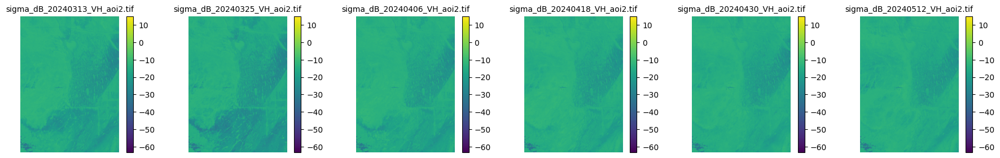

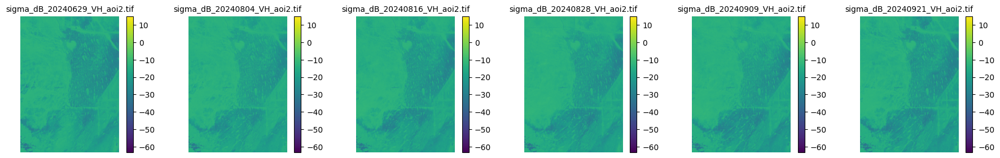

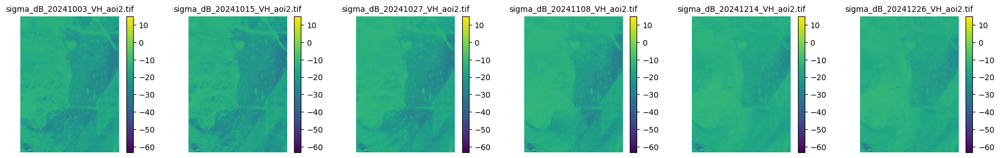

In [ ]:
# Visualize each image with consistent scaling
visualize_images_grid(vh_path, vh_min, vh_max, "VH")

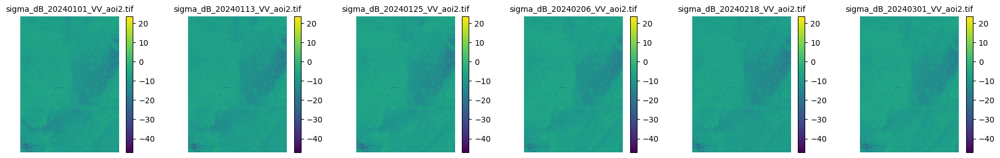

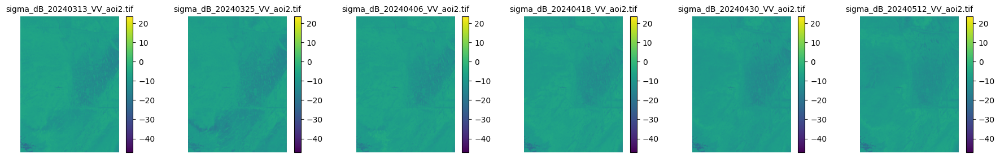

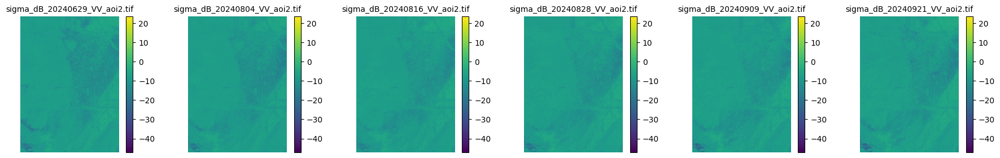

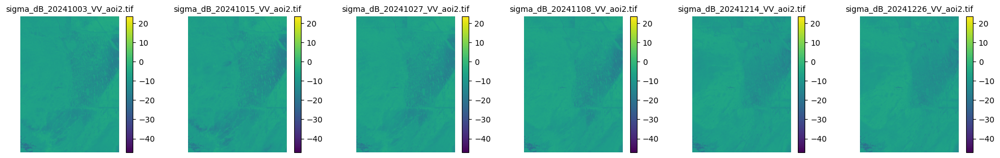

In [ ]:
# Visualize each image with consistent scaling
visualize_images_grid(vv_path, vv_min, vv_max, "VV")

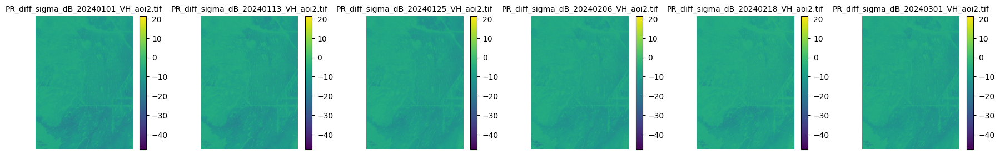

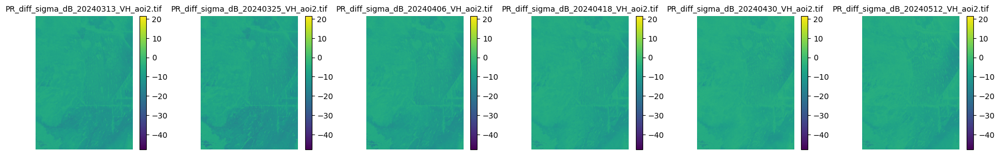

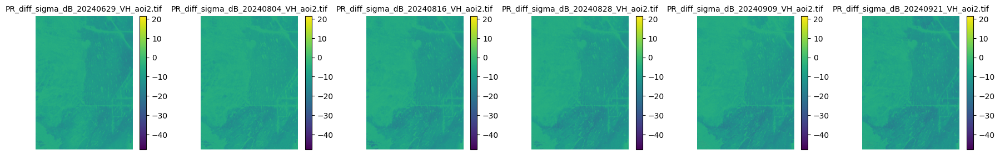

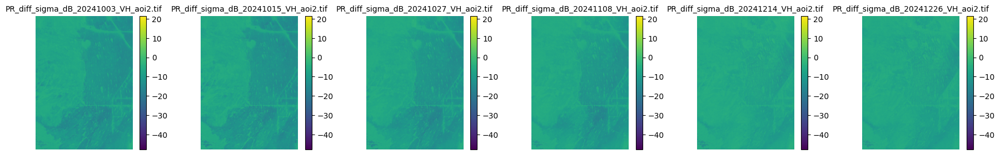

In [ ]:
# Visualize each image with consistent scaling
visualize_images_grid(pr_path, pr_min, pr_max, "PR")

## Combine VH-VV-PR data

In [8]:
# Create a function to load images in a folder
def load_images(folder_path): # Create a request 'folder path' as a directory of data
    images = [] # Create a temporal empty array of images
    for file in sorted(os.listdir(folder_path)): # Call the folfer 'path'
        if file.endswith(".tif"): # Search images ending in .tif
            with rasterio.open(os.path.join(folder_path, file)) as src: # Open the images located in folder path
                images.append(src.read(1))
    return np.array(images) # Return array of images

# Call function and load images
vh_images = load_images(vh_path)
vv_images = load_images(vv_path)
pr_images = load_images(pr_path)

print(f"System recognized {vh_images.shape[0]} images VH polarization with size {vh_images.shape[1:]} each one.")
print(f"System recognized {vv_images.shape[0]} images VV polarization with size {vv_images.shape[1:]} each one.")
print(f"System recognized {pr_images.shape[0]} images of PR Index with size {pr_images.shape[1:]} each one.")

assert vh_images.shape == vv_images.shape == pr_images.shape, "The dimensions and size of VH-VV-PR are equal"

# Combine the VH-VV-PR polarization with the same size and dimensions
master_data = np.stack([vh_images, vv_images, pr_images], axis=-1)  # (n_images)

print(f"System combine the VH-VV-PR polarizations wit the size {master_data.shape}")

System recognized 24 images VH polarization with size (3875, 2804) each one.
System recognized 24 images VV polarization with size (3875, 2804) each one.
System recognized 24 images of PR Index with size (3875, 2804) each one.
System combine the VH-VV-PR polarizations wit the size (24, 3875, 2804, 3)


# Import points (.shp) with labels and marks

In [9]:
# Load shapefile
shapefile_path = "/content/WETSAT_v2/0_Original_Files/aoi2/points_AOI2_BDE.shp"
gdf = gpd.read_file(shapefile_path)

# Verify unique values per label
print("\nUnique values by column:")
for col in gdf.columns:
    if gdf[col].dtype == 'object':
        print(f"\nColumna: {col}")
        print(gdf[col].unique())


Unique values by column:

Columna: Station
['3A11' '3A12' '3AN1W1' '3AS' '3AS3W1' '3ASW' 'BCA10' 'BCA12' 'BCA13'
 'BCA18' 'BCA20' 'BCA4' 'BCA5' 'BCA9' 'EDEN_10' 'EDEN_12' 'EDEN_14'
 'EDEN_5' 'EDEN_6' 'EDEN_8' 'EDEN_9' 'L28_GAP' 'NP201' 'NP202' 'NP203'
 'NP205' 'NP206' 'OT' 'P33' 'P34' 'RG1' 'RG2' 'TI-9' 'TMC' 'W11' 'W18'
 'W2' 'MO-214' 'NESRS1' 'NESRS4' 'SITE_62' 'SITE_64' 'SITE_65']

Columna: 1_01_2024_
['e11' 'e21' 'e22' 'e23']

Columna: 1_13_2024_
['e11' 'e21' 'e22' 'e23']

Columna: 1_25_2024_
['e11' 'e21' 'e22' 'e23']

Columna: 2_06_2024_
['e11' 'e21' 'e22' 'e23']

Columna: 2_18_2024_
['e21' 'e22' 'e13' 'e23' 'e11']

Columna: 3_01_2024_
['e21' 'e22' 'e13' 'e23' 'e11']

Columna: 3_13_2024_
['e21' 'e22' 'e13' 'e23' 'e11' 'e12']

Columna: 3_25_2024_
['e21' 'e22' 'e11' 'e13' 'e23' 'e12']

Columna: 4_06_2024_
['e11' 'e21' 'e22' 'e13' 'e23' 'e12']

Columna: 4_18_2024_
['e11' 'e21' 'e22' 'e13' 'e23' 'e12']

Columna: 4_30_2024_
['e11' 'e21' 'e22' 'e13' 'e12']

Columna: 5_12_2024_
['e11' '

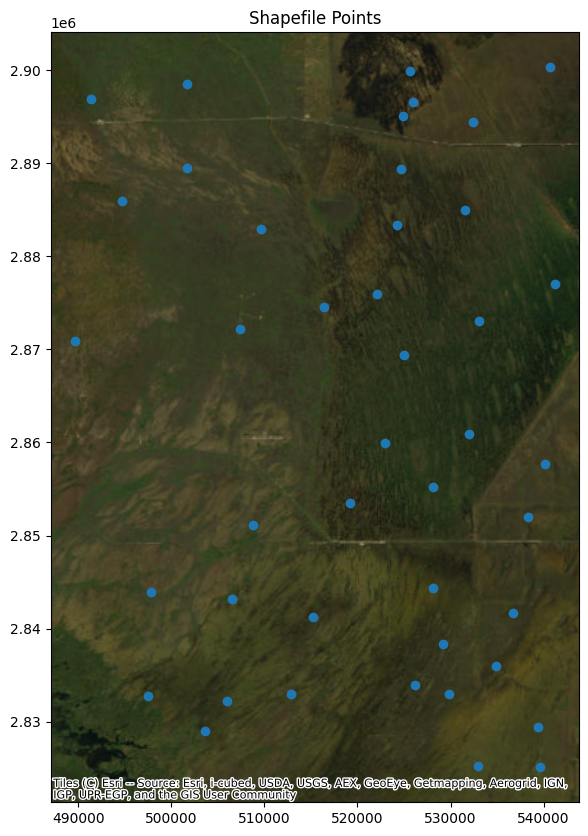

In [10]:
#providers = ctx.providers
#providers

# Plot the .shp
ax = gdf.plot(figsize=(10, 10))
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.Esri.WorldImagery)
plt.title('Shapefile Points')
plt.show()

## Verification shapefile information (rows and fields)

In [11]:
# Show all rows and fields
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Display Geodataframe as table
display(gdf)

,Station,1_01_2024_,1_13_2024_,1_25_2024_,2_06_2024_,2_18_2024_,3_01_2024_,3_13_2024_,3_25_2024_,4_06_2024_,4_18_2024_,4_30_2024_,5_12_2024_,6_29_2024_,8_04_2024_,8_16_2024_,8_28_2024_,9_09_2024_,9_21_2024_,10_03_2024,10_15_2024,10_27_2024,11_08_2024,12_14_2024,12_26_2024,geometry
0,3A11,e11,e11,e11,e11,e21,e21,e21,e21,e11,e11,e11,e11,e11,e11,e11,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (525605.34 2899897.789)
1,3A12,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (532417.339 2894468.104)
2,3AN1W1,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (525972.769 2896545.448)
3,3AS,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,e22,POINT (531579.708 2884991.363)
4,3AS3W1,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (522955.882 2859933.859)
5,3ASW,e21,e21,e21,e21,e21,e21,e21,e11,e11,e11,e11,e11,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (516424.545 2874596.99)
6,BCA10,e23,e23,e23,e23,e13,e13,e13,e13,e13,e13,e13,e13,e23,e23,e23,e23,e23,e23,e23,e23,e23,e23,e23,e23,POINT (497798.702 2843969)
7,BCA12,e23,e23,e23,e23,e23,e23,e23,e23,e23,e13,e13,e13,e13,e13,e13,e23,e23,e23,e23,e23,e23,e23,e23,e23,POINT (491340.96 2896882.125)
8,BCA13,e23,e23,e23,e23,e23,e23,e23,e13,e13,e13,e13,e13,e13,e23,e23,e23,e23,e23,e23,e23,e23,e23,e23,e23,POINT (494639.195 2885990.343)
9,BCA18,e21,e21,e21,e21,e21,e21,e21,e21,e11,e11,e11,e11,e11,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,e21,POINT (501686.276 2898580.719)


## Verify Coordinate Reference System (CRS)

In [12]:
# Open a reference raster to get CRS and bounds
with rasterio.open(os.path.join(vh_path, vh_files[0])) as src:
    gdf = gdf.to_crs(src.crs) # Reproject shapefile to match raster CRS
    transform = src.transform

raster_crs = src.crs
print("The Coordinate Reference System (CRS) is:", raster_crs)

raster_bounds = box(*src.bounds)

print("Bounds image:", src.bounds)
print("Bounds shapefile:", gdf.total_bounds)

# Filter points that fall within the raster extent
gdf_filtered = gdf[gdf.geometry.within(raster_bounds)]
print(f"Points inside raster: {len(gdf_filtered)} of {len(gdf)}")

# Extract the coordinates (x, y) in each point
coords = [(geom.x, geom.y) for geom in gdf.geometry]

The Coordinate Reference System (CRS) is: EPSG:32617
Bounds image: BoundingBox(left=488300.0, bottom=2823700.0, right=544380.0, top=2901200.0)
Bounds shapefile: [ 489599.51383088 2825091.04763268  541222.74691443 2900327.16197831]
Points inside raster: 43 of 43


In [13]:
def extract_pixel_values(image_array, transform, points_gdf):
    rows, cols = rasterio.transform.rowcol(transform, points_gdf.geometry.x, points_gdf.geometry.y)
    values = []
    for r, c in zip(rows, cols):
        try:
            values.append(image_array[r, c])
        except IndexError:
            values.append(np.nan)
    return values

with rasterio.open(os.path.join(vh_path, vh_files[0])) as src:
    transform = src.transform

etiqueta_cols = [col for col in gdf.columns if col not in ['Station', 'geometry']]
assert len(etiqueta_cols) == master_data.shape[0], "The columns and labels must be equal with images (size)"

results = []

for i, col in enumerate(etiqueta_cols):
    vh_img = master_data[i, :, :, 0]
    vv_img = master_data[i, :, :, 1]
    pr_img = master_data[i, :, :, 2]

    etiquetas = gdf[col]

    vh_vals = extract_pixel_values(vh_img, transform, gdf)
    vv_vals = extract_pixel_values(vv_img, transform, gdf)
    pr_vals = extract_pixel_values(pr_img, transform, gdf)

    df = pd.DataFrame({
        'VH': vh_vals,
        'VV': vv_vals,
        'PR': pr_vals,
        'etiqueta': etiquetas,
        'imagen': col
    })

    results.append(df)

In [14]:
df_final = pd.concat(results, ignore_index=True)
data_table.DataTable(df_final, include_index=False, num_rows_per_page=100)

,VH,VV,PR,etiqueta,imagen
0,-22.825550,-7.347487,-15.478063,e11,1_01_2024_
1,-17.096886,-5.754534,-11.342352,e21,1_01_2024_
2,-22.578693,-8.405565,-14.173128,e21,1_01_2024_
3,-15.478000,-9.186302,-6.291698,e22,1_01_2024_
4,-15.520418,-6.393513,-9.126905,e21,1_01_2024_
5,-14.316200,-6.564840,-7.751360,e21,1_01_2024_
6,-13.446002,-5.001499,-8.444503,e23,1_01_2024_
7,-12.553789,-6.720149,-5.833640,e23,1_01_2024_
8,-13.728954,-6.007545,-7.721409,e23,1_01_2024_
9,-12.018113,-7.887706,-4.130407,e21,1_01_2024_


In [15]:
# Estimate observations by labels and marks
number_etiquetas = df_final['etiqueta'].value_counts().sort_index()

# Show results
print("Number of observations by label:")
print(number_etiquetas)

Number of observations by label:
etiqueta
e11    129
e12      8
e13     33
e21    567
e22    208
e23     87
Name: count, dtype: int64


In [16]:
# Create a list of all labels
all_etiquetas = ['e11', 'e12', 'e13', 'e21', 'e22', 'e23']

# Create a encoder with labels
le = LabelEncoder()
le.fit(all_etiquetas)

# Codify labels and create transformations
y_encoded = le.transform(df_final['etiqueta'])

label_enc= "/models"
# Create output directory if it doesn't exist
os.makedirs(label_enc, exist_ok=True)

# Store encoder
import joblib
joblib.dump(le, "/models/label_encoder.pkl")
print("🔠 Codifier stored as'label_encoder.pkl'")

🔠 Codifier stored as'label_encoder.pkl'


# Create Random Forest Classifier Model

### Configure best Hyperparameters


- n_estimators: Number of trees in the forest. The larger the better, but also the longer it will take to compute
- max_depth: Maximum depth of each tree.
- min_samples_split: Minimum samples required to split an internal node.
- min_samples_leaf: Minimum samples required at a leaf node.
- max_features: Size of the random subsets of features to consider when splitting a node. The lower the greater the reduction of variance, but also the greater the increase in bias.

In [17]:
warnings.filterwarnings("ignore")

# Define Hyperparameters
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'log2']
}

## Start RF model with (70% training) and (30% validation)

In [18]:
# Prepare data
X = df_final[['VH', 'VV', 'PR']].values
y = y_encoded

# Split training and validation
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)

# Define base modeol
rf = RandomForestClassifier(random_state=42)

# Search of hyperparameters
grid_search = GridSearchCV(rf, param_grid, cv=3, verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Evaluate the model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

print(f"\n🎯 RF model accuracy: {accuracy_score(y_test, y_pred):.4f}")
print("\n✅ Best hyperparameters:")
print(grid_search.best_params_)
print("\n📊 Confusion matrix:")
print(confusion_matrix(y_test, y_pred))
print("\n📋 Classification report:")
print(classification_report(y_test, y_pred))

# Store model
joblib.dump(best_model, "/models/modelo_random_forest.pkl")
print("💾 Model stored in '/models/modelo_random_forest.pkl'")

Fitting 3 folds for each of 48 candidates, totalling 144 fits

🎯 RF model accuracy: 0.6032

✅ Best hyperparameters:
{'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}

📊 Confusion matrix:
[[  0   0   0  33   4   2]
 [  0   0   0   1   1   0]
 [  1   0   0   6   0   3]
 [  3   0   1 145  10  11]
 [  0   0   1  27  30   5]
 [  0   0   0  14   0  12]]

📋 Classification report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        39
           1       0.00      0.00      0.00         2
           2       0.00      0.00      0.00        10
           3       0.64      0.85      0.73       170
           4       0.67      0.48      0.56        63
           5       0.36      0.46      0.41        26

    accuracy                           0.60       310
   macro avg       0.28      0.30      0.28       310
weighted avg       0.52      0.60      0.55       310

💾 Model stored in '/m

# Start predictions using Random Forest Model

### Calculate the PR index in new AOI

In [19]:
## Access the VH Path
vh_path = "/content/WETSAT_v2/0_Original_Files/aoi3/VH"
## Access the VV Path
vv_path = "/content/WETSAT_v2/0_Original_Files/aoi3/VV"
## Create the PR Index path
pr_path = "/content/WETSAT_v2/0_Original_Files/aoi3/PR_index"

# Create output directory if it doesn't exist
os.makedirs(pr_path, exist_ok=True)

# List VH and VV files (assuming matching filenames)
vh_files = sorted([f for f in os.listdir(vh_path) if f.endswith(".tif")]) # Search files ending with .tif
vv_files = sorted([f for f in os.listdir(vv_path) if f.endswith(".tif")]) # Search files ending with .tif

# Loop through files and compute PR index scaled between 0 and 1
for vh_file, vv_file in zip(vh_files, vv_files):
    # Read the vh_files and vv_files
    with rasterio.open(os.path.join(vh_path, vh_file)) as vh_src, \
         rasterio.open(os.path.join(vv_path, vv_file)) as vv_src:

        vh = vh_src.read(1).astype("float32") # Converts the data to 32-bit float
        vv = vv_src.read(1).astype("float32") # Converts the data to 32-bit float

        pr_index_diff = vh - vv  # Compute PR index as difference

        # Save PR index difference
        profile = vh_src.profile
        profile.update(dtype="float32", count=1)

        pr_filename = f"PR_diff_{vh_file}"
        with rasterio.open(os.path.join(pr_path, pr_filename), "w", **profile) as dst:
            dst.write(pr_index_diff, 1)

print("PR index (VH - VV) computation complete.")

PR index (VH - VV) computation complete.


### Import the RF model

In [20]:
rf_model = joblib.load("/models/modelo_random_forest.pkl")
le = joblib.load("/models/label_encoder.pkl")

In [21]:
vv_files = sorted([f for f in os.listdir(vv_path) if f.endswith(".tif")])
vh_files = sorted([f for f in os.listdir(vh_path) if f.endswith(".tif")])
pr_files = sorted([f for f in os.listdir(pr_path) if f.endswith(".tif")])

assert len(vv_files) == len(vh_files) == len(pr_files), "The size of VV, VH and PR must be equal (size)"

In [22]:
def predict_and_save(vv_file, vh_file, pr_file, model, encoder, index):
    with rasterio.open(os.path.join(vv_path, vv_file)) as vv_src, \
         rasterio.open(os.path.join(vh_path, vh_file)) as vh_src, \
         rasterio.open(os.path.join(pr_path, pr_file)) as pr_src:

        vv = vv_src.read(1)
        vh = vh_src.read(1)
        pr = pr_src.read(1)

        assert vv.shape == vh.shape == pr.shape, "size verification"

        # Detect NoData mask (assuming all bands share the same mask)
        nodata_val = vv_src.nodata
        valid_mask = (vv != nodata_val) & (vh != nodata_val) & (pr != nodata_val)

        stacked = np.stack([vh, vv, pr], axis=-1)
        shape = stacked.shape[:2]
        flat_pixels = stacked.reshape(-1, 3)

        # Apply mask to valid pixels
        flat_mask = valid_mask.flatten()
        valid_pixels = flat_pixels[flat_mask]

        # Predict only on valid pixels
        pred_encoded = model.predict(valid_pixels)

        # Create full prediction array filled with nodata (255)
        pred_numeric = np.full(flat_mask.shape, 255, dtype=np.uint8)
        pred_numeric[flat_mask] = pred_encoded
        pred_numeric = pred_numeric.reshape(shape)

        # Save prediction raster
        profile = vv_src.profile
        profile.update(dtype=rasterio.uint8, count=1, nodata=255)

        output_path = f"Forecasting_labels_{index+1:02d}.tif"
        with rasterio.open(output_path, "w", **profile) as dst:
            dst.write(pred_numeric, 1)

        print(f"✅ Image stored as: {output_path}")

In [23]:
for i in range(len(vv_files)):
    predict_and_save(vv_files[i], vh_files[i], pr_files[i], rf_model, le, i)

✅ Image stored as: Forecasting_labels_01.tif
✅ Image stored as: Forecasting_labels_02.tif
✅ Image stored as: Forecasting_labels_03.tif
✅ Image stored as: Forecasting_labels_04.tif
✅ Image stored as: Forecasting_labels_05.tif
✅ Image stored as: Forecasting_labels_06.tif
✅ Image stored as: Forecasting_labels_07.tif
✅ Image stored as: Forecasting_labels_08.tif
✅ Image stored as: Forecasting_labels_09.tif
✅ Image stored as: Forecasting_labels_10.tif
✅ Image stored as: Forecasting_labels_11.tif
✅ Image stored as: Forecasting_labels_12.tif
✅ Image stored as: Forecasting_labels_13.tif
✅ Image stored as: Forecasting_labels_14.tif
✅ Image stored as: Forecasting_labels_15.tif
✅ Image stored as: Forecasting_labels_16.tif
✅ Image stored as: Forecasting_labels_17.tif
✅ Image stored as: Forecasting_labels_18.tif
✅ Image stored as: Forecasting_labels_19.tif
✅ Image stored as: Forecasting_labels_20.tif
✅ Image stored as: Forecasting_labels_21.tif
✅ Image stored as: Forecasting_labels_22.tif
✅ Image st